In [1]:
import os
from tqdm import tqdm
import pickle
import random

import pandas as pd
import numpy as np
import scipy
from sklearn.metrics.pairwise import pairwise_kernels
import matplotlib.pyplot as plt

from metaspace import SMInstance
from anndata import AnnData
from metaspace2anndata import dataset_to_anndata
import scanpy as sc


In [2]:
import utils
from config import store_dir, data_dir, date_key
%load_ext autoreload
%autoreload 2

# Load data

In [7]:
dss = pickle.load(open(os.path.join(store_dir, 'all_datasets.pickle'), "rb" ) )

In [4]:
results = pickle.load(open(os.path.join(store_dir, 'hmdb4_results.pickle'), "rb" ) )

In [5]:
md = utils.make_metadata_dict(dss, results, only_results=True)
mdt = utils.clean_metadata_table(utils.metadata_dict_totable(md))

In [6]:
mdt['top_Organism'] = utils.top_feature_col(mdt['Organism'], top=10)
mdt['top_Condition'] = utils.top_feature_col(mdt['Condition'], top=10)
mdt['top_Organism_Part'] = utils.top_feature_col(mdt['Organism_Part'], top=10)
mdt['top_Polarity'] = utils.top_feature_col(mdt['Polarity'], top=10)
mdt['top_maldi_matrix'] = utils.top_feature_col(mdt['maldi_matrix'], top=8)
mdt['top_Group'] = utils.top_feature_col(mdt['Group'], top=10)

# Make table with all features and create AnnData object

## Ions as features

In [87]:
fdr_cutoff = 0.5

In [104]:
# Get all features

features = []
for tab in tqdm(results.values()):
    tmp_tab = tab[tab['fdr'] <= 0.5]
    for ix in tmp_tab['ion']:
            features.append(ix)
features = list(set(features))

100%|██████████| 7443/7443 [00:05<00:00, 1358.54it/s]


In [98]:
pd.DataFrame([tmp_tab.reset_index().set_index('ion').loc['C19H14O9+Na+',:], tmp_tab.reset_index().set_index('ion').loc['C21H14O10+Na+',:]])

,formula,adduct,ionFormula,fdr,mz,offSample,moleculeNames,intensity,moleculeIds
C19H14O9+Na+,C19H14O9,+Na,C19H14O9Na,0.05,409.052964,True,[Shoyuflavone A],1.710851e+06,[HMDB0034582]
C21H14O10+Na+,C21H14O10,+Na,C21H14O10Na,0.05,449.047878,True,"[13,14-bis(acetyloxy)-9-oxo-8,17-dioxatetracyc...",2.466654e+06,"[HMDB0128411, HMDB0128410, HMDB0128409, HMDB01..."


In [100]:
tmp_tab.reset_index().set_index('ion').loc['C19H14O9+Na+',:].name

'C19H14O9+Na+'

In [10]:
# Initialize empty df
fdr_data = pd.DataFrame(0, columns=list(set(features)), index=results.keys(), dtype='float64')

In [11]:
fdr_data.shape

(7443, 77087)

In [12]:
# Fill dataframe
for i in tqdm(results.keys()):
    # It is late, I lost my creativity for variable names
    tmp_tab = results[i][results[i]['fdr'] <= 0.5]
    
    ttt = tmp_tab.reset_index()[['ion', 'intensity']]
    ttt2 = ttt.groupby('ion').sum()
    
    fdr_data.loc[i, ttt2.index] = ttt2['intensity'].values

100%|██████████| 7443/7443 [01:54<00:00, 64.97it/s]


In [27]:
adata = AnnData(X=fdr_data.to_numpy(), var=pd.DataFrame(features), obs=mdt.loc[fdr_data.index, :])

/tmp/ipykernel_86/3986562972.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(X=fdr_data.to_numpy(), var=pd.DataFrame(features), obs=mdt.loc[fdr_data.index, :])
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [28]:
pickle.dump(adata, open( os.path.join(store_dir, 'all_datasets_anndata.pickle'), "wb" ))

## Molecules as features

In [14]:
results[list(results.keys())[0]].reset_index()['formula']

0             C14H16O6
1           C44H86NO8P
2             C35H52O5
3            C37H62O10
4            C37H47NO4
             ...      
1162         C32H45NO4
1163         C45H89O8P
1164          C53H80O4
1165        C32H36N4O5
1166    C19H14ClF5N4O2
Name: formula, Length: 1167, dtype: object

In [15]:
mol_features = []
for tab in tqdm(results.values()):
    tmp_tab = tab[tab['fdr'] <= 0.5]
    for ix in tmp_tab.reset_index()['formula']:
            mol_features.append(ix)
mol_features = list(set(mol_features))

100%|██████████| 7443/7443 [00:10<00:00, 692.96it/s]


In [16]:
len(mol_features)

11526

In [17]:
mol_data = pd.DataFrame(0, columns=list(set(mol_features)), index=results.keys(), dtype='float64')

In [25]:
# Fill dataframe
for i in tqdm(results.keys()):
    # It is late, I lost my creativity for variable names
    tmp_tab = results[i][results[i]['fdr'] <= 0.5]
    
    ttt = tmp_tab.reset_index()[['formula', 'intensity']]
    ttt2 = ttt.groupby('formula').sum()
    
    mol_data.loc[i, ttt2.index] = ttt2['intensity'].values

100%|██████████| 7443/7443 [00:37<00:00, 197.88it/s]


In [26]:
adata_mol = AnnData(X=mol_data.to_numpy(), var=pd.DataFrame(mol_features), obs=mdt.loc[mol_data.index, :])

/tmp/ipykernel_78/4285724389.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_mol = AnnData(X=mol_data.to_numpy(), var=pd.DataFrame(mol_features), obs=mdt.loc[mol_data.index, :])
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [27]:
pickle.dump(adata_mol, open( os.path.join(store_dir, 'all_datasets_mol_anndata.pickle'), "wb" ))

# Analysis

## Molecules

In [8]:
adata_mol = pickle.load(open( os.path.join(store_dir, 'all_datasets_mol_anndata.pickle'), "rb" ))

In [9]:
sc.pp.filter_genes(adata_mol, min_cells=200)
sc.pp.filter_cells(adata_mol, min_genes=50)
sc.pp.normalize_total(adata_mol, target_sum=1e4)

In [10]:
adata_mol

AnnData object with n_obs × n_vars = 6705 × 8878
    obs: 'Organism', 'Condition', 'Organism_Part', 'Polarity', 'maldi_matrix', 'Group', 'mzmin', 'mzmax', 'top_Organism', 'top_Condition', 'top_Organism_Part', 'top_Polarity', 'top_maldi_matrix', 'top_Group', 'n_genes'
    var: 0, 'n_cells'

In [11]:
sc.pp.neighbors(adata_mol, metric='cosine')

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
sc.tl.leiden(adata_mol)

In [13]:
sc.tl.umap(adata_mol)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

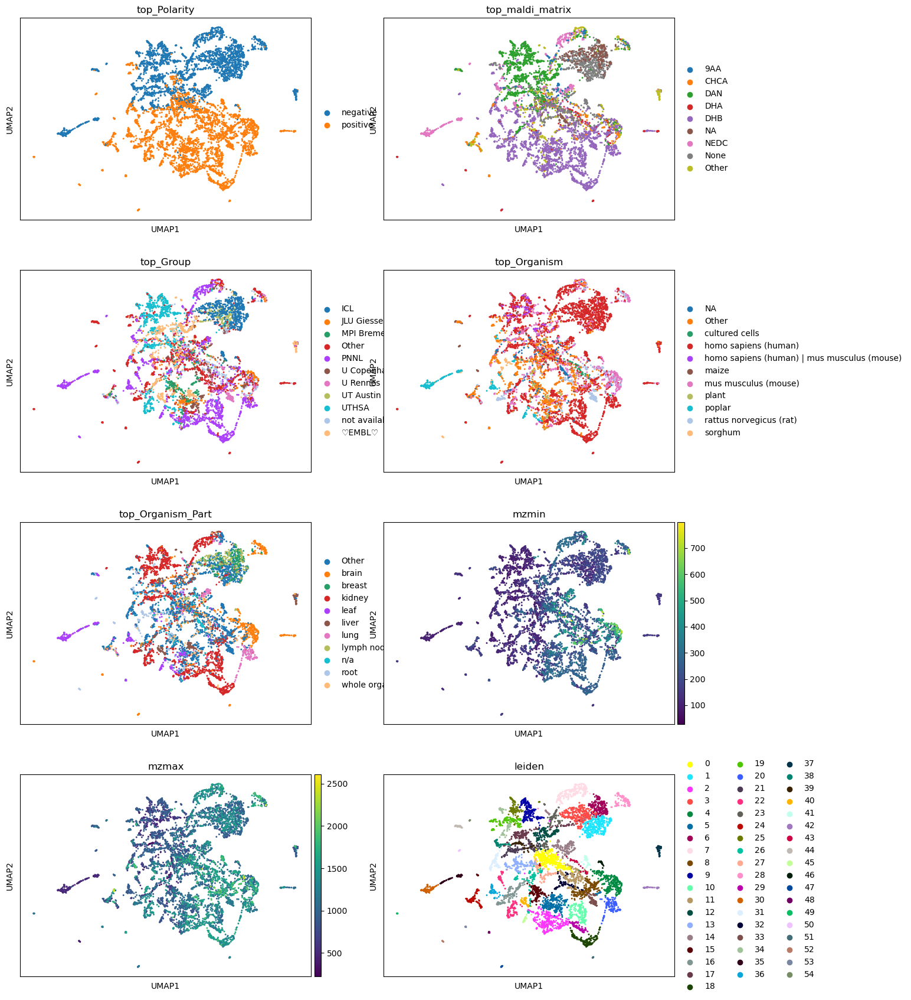

In [14]:
sc.pl.umap(adata_mol, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 
                             'top_Organism', 'top_Organism_Part', 'mzmin', 
                             'mzmax', 'leiden'], 
           ncols=2)

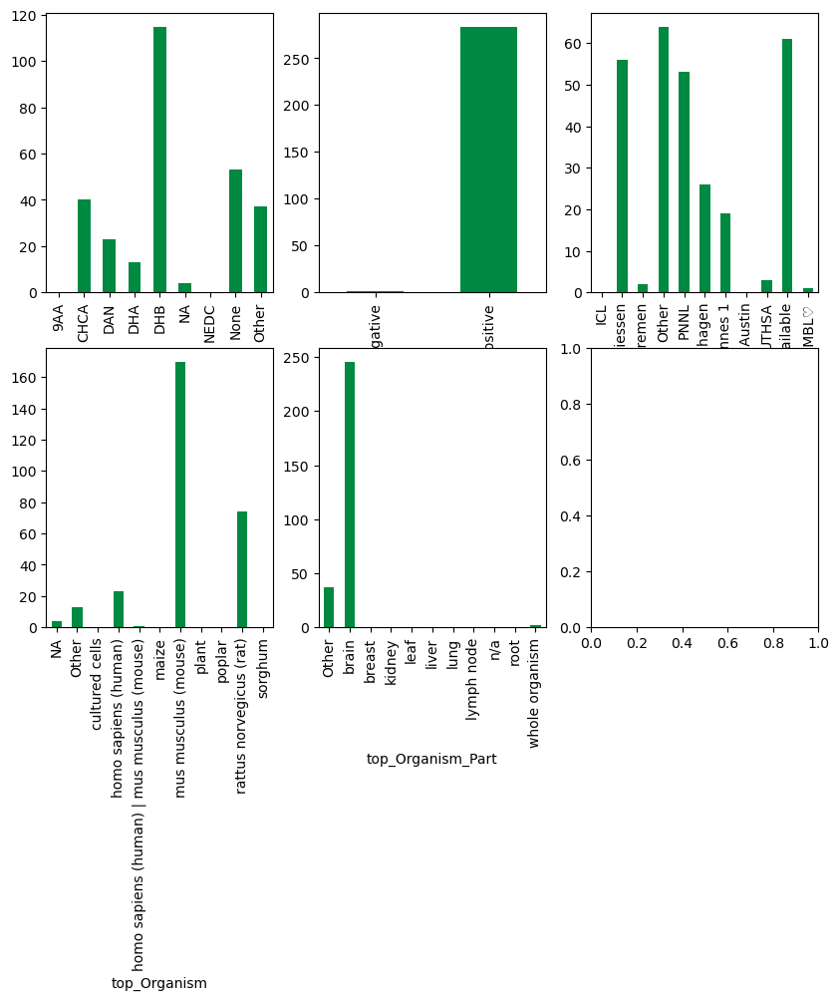

In [15]:
utils.plot_cluster_metadata(adata_mol, cluster='4', figsize=(10, 8))

### BBKNN

In [35]:
adata_mol_bbknn = pickle.load(open( os.path.join(store_dir, 'all_datasets_mol_anndata.pickle'), "rb" ))

sc.pp.filter_genes(adata_mol_bbknn, min_cells=200)
sc.pp.filter_cells(adata_mol_bbknn, min_genes=50)
sc.pp.normalize_total(adata_mol_bbknn, target_sum=1e4)

In [36]:
sc.tl.pca(adata_mol_bbknn)
sc.external.pp.bbknn(adata_mol_bbknn, batch_key='maldi_matrix', metric='euclidean', neighbors_within_batch=1)
sc.tl.umap(adata_mol_bbknn)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

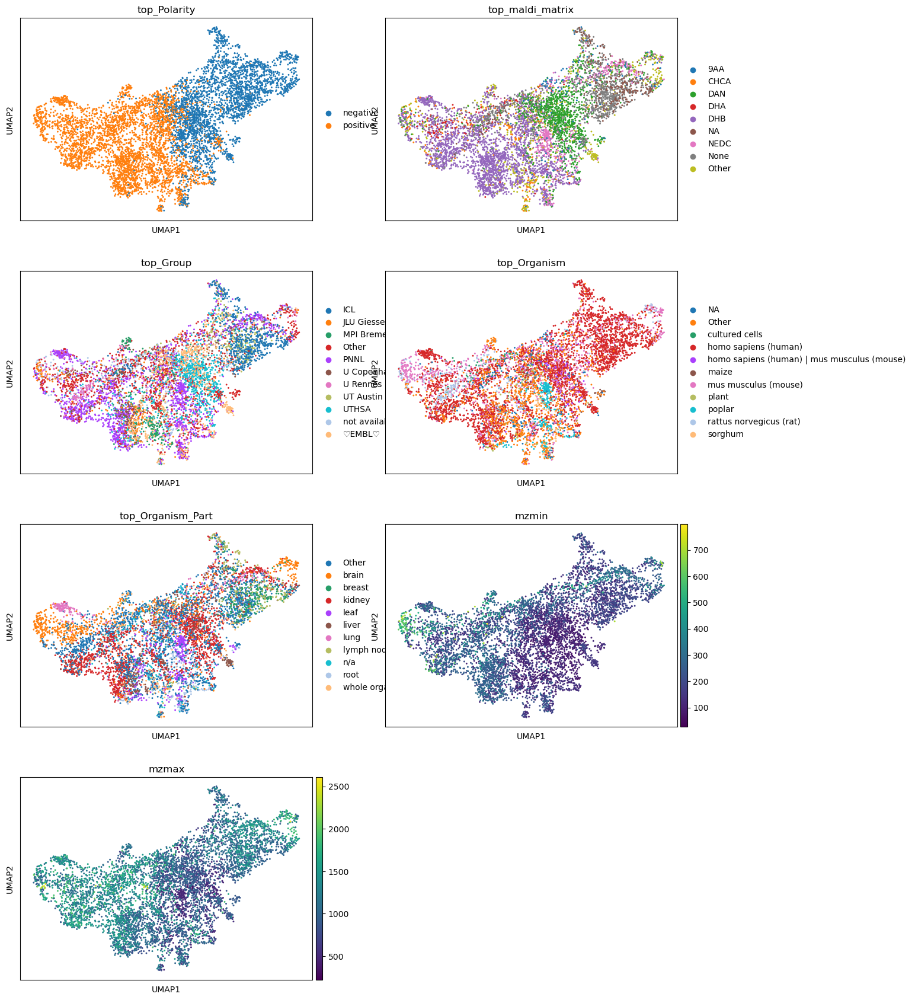

In [37]:
sc.pl.umap(adata_mol_bbknn, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 'top_Organism', 'top_Organism_Part', 'mzmin', 'mzmax'], ncols=2)

### Positive

In [16]:
adata_mol_pos = pickle.load(open( os.path.join(store_dir, 'all_datasets_mol_anndata.pickle'), "rb" ))
adata_mol_pos = adata_mol_pos[adata_mol_pos.obs['Polarity']=='positive',:]
sc.pp.filter_genes(adata_mol_pos, min_cells=200)
sc.pp.filter_cells(adata_mol_pos, min_genes=50)
sc.pp.normalize_total(adata_mol_pos, target_sum=1e4)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [17]:
sc.pp.neighbors(adata_mol_pos, metric='cosine')
sc.tl.leiden(adata_mol_pos)
sc.tl.umap(adata_mol_pos)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

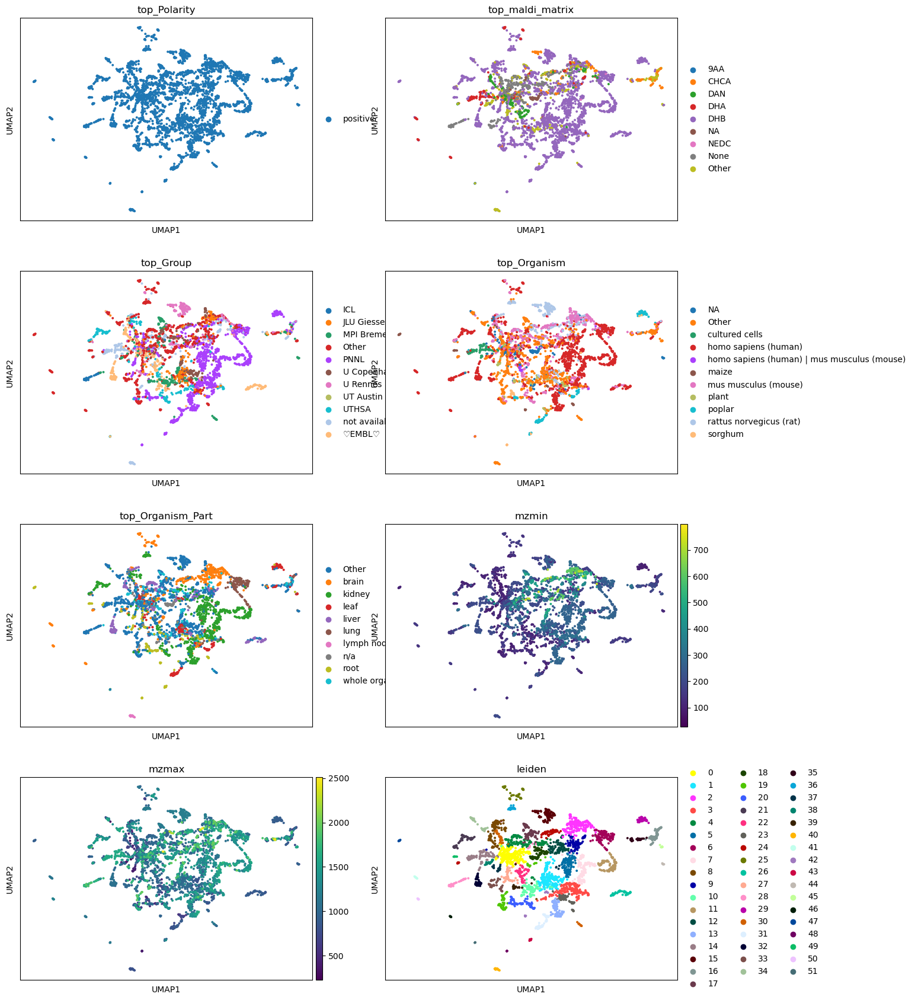

In [18]:
sc.pl.umap(adata_mol_pos, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 
                             'top_Organism', 'top_Organism_Part', 'mzmin', 
                             'mzmax', 'leiden'], 
           ncols=2)

#### Rank metabolites

In [77]:
adata_mol_pos.var.rename(columns={0: 'molecule'}).reset_index().set_index('molecule').drop(columns='index')

,n_cells
molecule,
C39H66O5,727
C30H26O15,1125
C10H16N2O7,656
C14H10N4O5,289
C19H32O8S2,393
...,...
C11H20N2O4S3,811
C22H30O5,353
C31H54NO4,234


In [72]:
sc.pp.log1p(adata_mol_pos)
adata_mol_pos.var = adata_mol_pos.var.rename(columns={0: 'molecule'}).reset_index().set_index('molecule').drop(columns='index')

ValueError: AnnData expects .var.index.name to be a string or None, but you passed a name of type 'int'

In [118]:
adata_mol_pos.obs['is_brain'] = adata_mol_pos.obs['top_Organism_Part'].apply(lambda x: 'brain' if x=='brain' else 'other')
adata_mol_pos.obs['is_liver'] = adata_mol_pos.obs['top_Organism_Part'].apply(lambda x: 'liver' if x=='liver' else 'other')
adata_mol_pos.obs['is_kidney'] = adata_mol_pos.obs['top_Organism_Part'].apply(lambda x: 'kidney' if x=='kidney' else 'other')

In [79]:
sc.tl.rank_genes_groups(adata_mol_pos, 'is_brain')

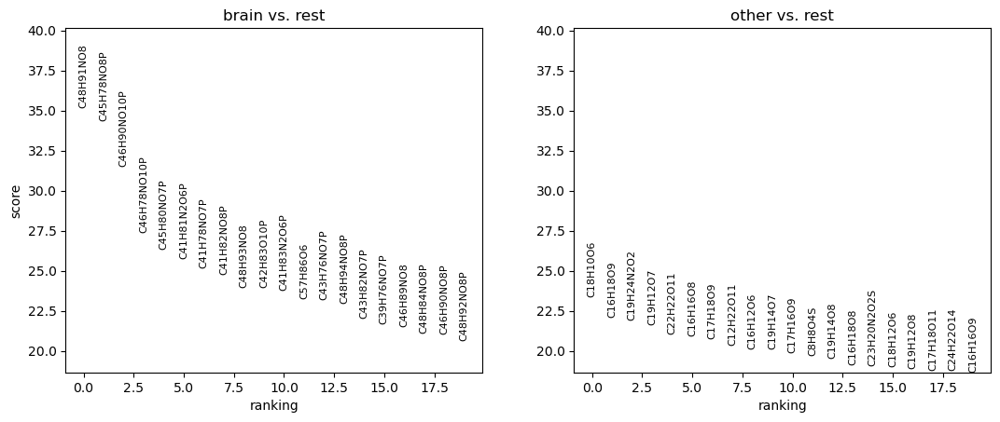

In [80]:
sc.pl.rank_genes_groups(adata_mol_pos)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

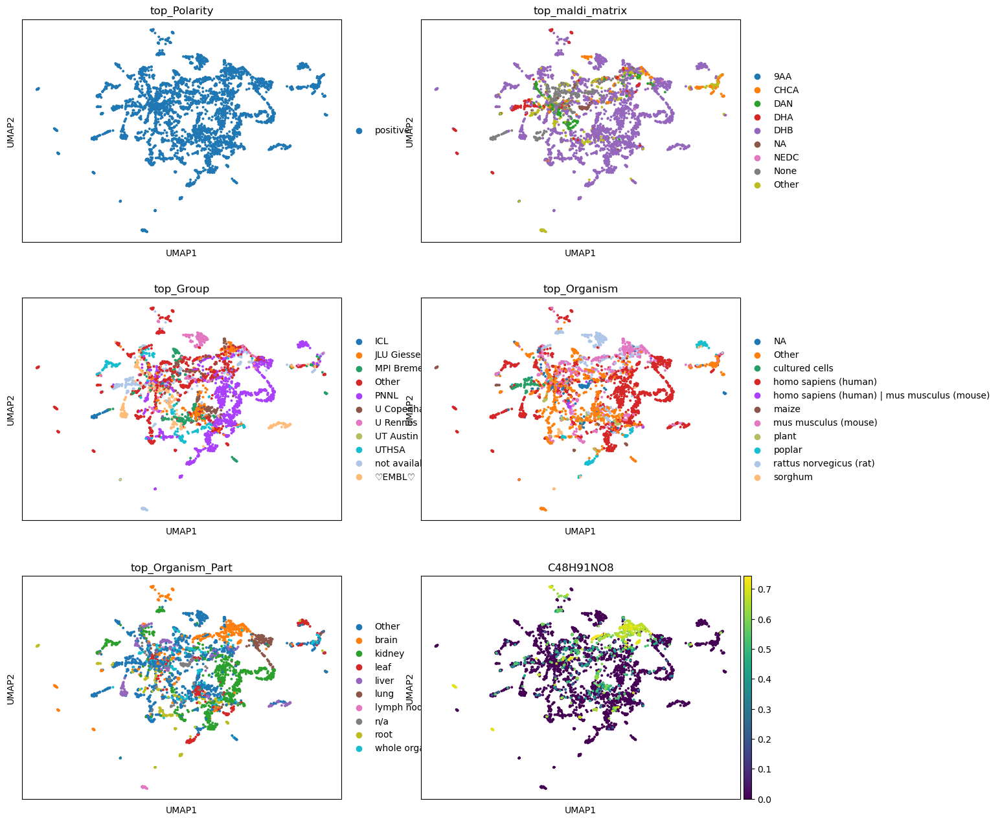

In [81]:
sc.pl.umap(adata_mol_pos, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 
                             'top_Organism', 'top_Organism_Part', 'C48H91NO8'], 
           ncols=2)


In [83]:
sc.tl.rank_genes_groups(adata_mol_pos, 'is_liver')

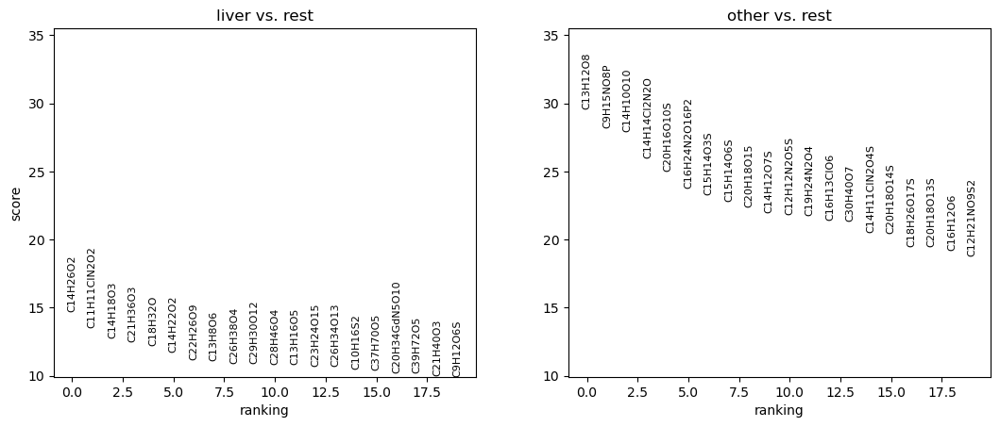

In [84]:
sc.pl.rank_genes_groups(adata_mol_pos)

In [117]:
adata_mol_pos.uns['rank_genes_groups']['names'][3][0]

'C21H36O3'

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

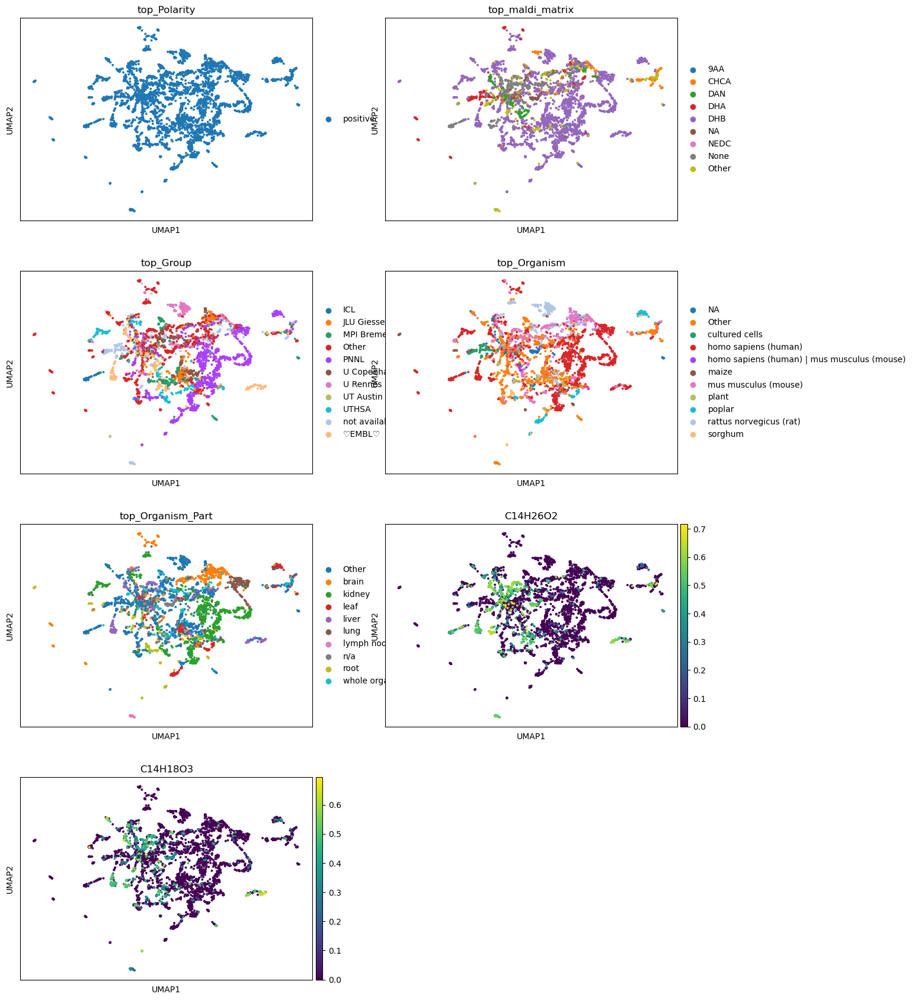

In [116]:
sc.pl.umap(adata_mol_pos, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 
                             'top_Organism', 'top_Organism_Part', 'C14H26O2', 'C14H18O3'], 
           ncols=2)

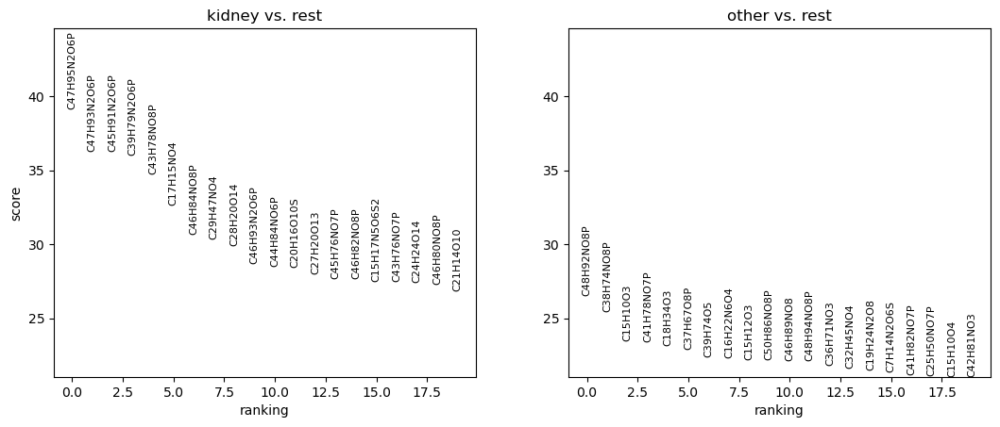

In [120]:
sc.tl.rank_genes_groups(adata_mol_pos, 'is_kidney')
sc.pl.rank_genes_groups(adata_mol_pos)

In [122]:
adata_mol_pos.uns['rank_genes_groups']['names'][1][0]

'C47H93N2O6P'

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

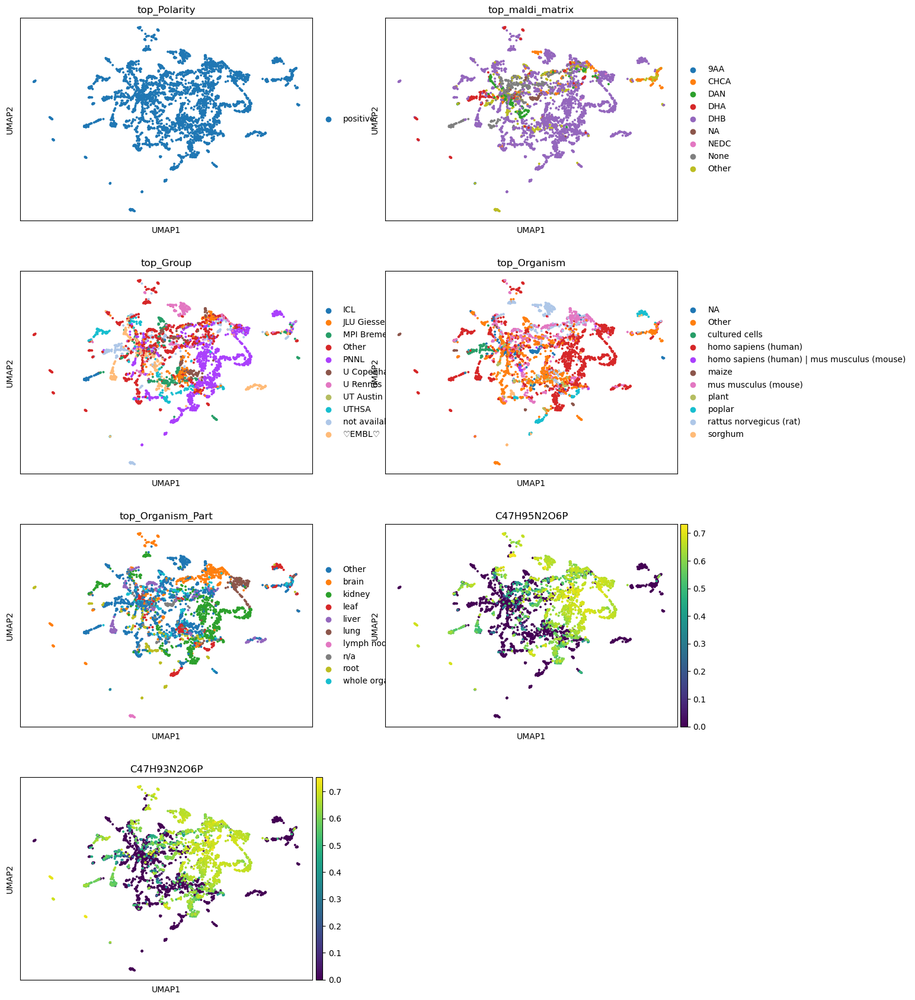

In [123]:
sc.pl.umap(adata_mol_pos, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 
                             'top_Organism', 'top_Organism_Part', 'C47H95N2O6P', 'C47H93N2O6P'], 
           ncols=2)

#### BBKNN

In [19]:
adata_mol_pos_bbknn = pickle.load(open( os.path.join(store_dir, 'all_datasets_mol_anndata.pickle'), "rb" ))
adata_mol_pos_bbknn = adata_mol_pos_bbknn[adata_mol_pos_bbknn.obs['Polarity']=='positive',:]
sc.pp.filter_genes(adata_mol_pos_bbknn, min_cells=200)
sc.pp.filter_cells(adata_mol_pos_bbknn, min_genes=50)
sc.pp.normalize_total(adata_mol_pos_bbknn, target_sum=1e4)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [24]:
sc.tl.pca(adata_mol_pos_bbknn)
sc.external.pp.bbknn(adata_mol_pos_bbknn, batch_key='maldi_matrix', metric='euclidean', neighbors_within_batch=1)
sc.tl.leiden(adata_mol_pos_bbknn)
sc.tl.umap(adata_mol_pos_bbknn)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

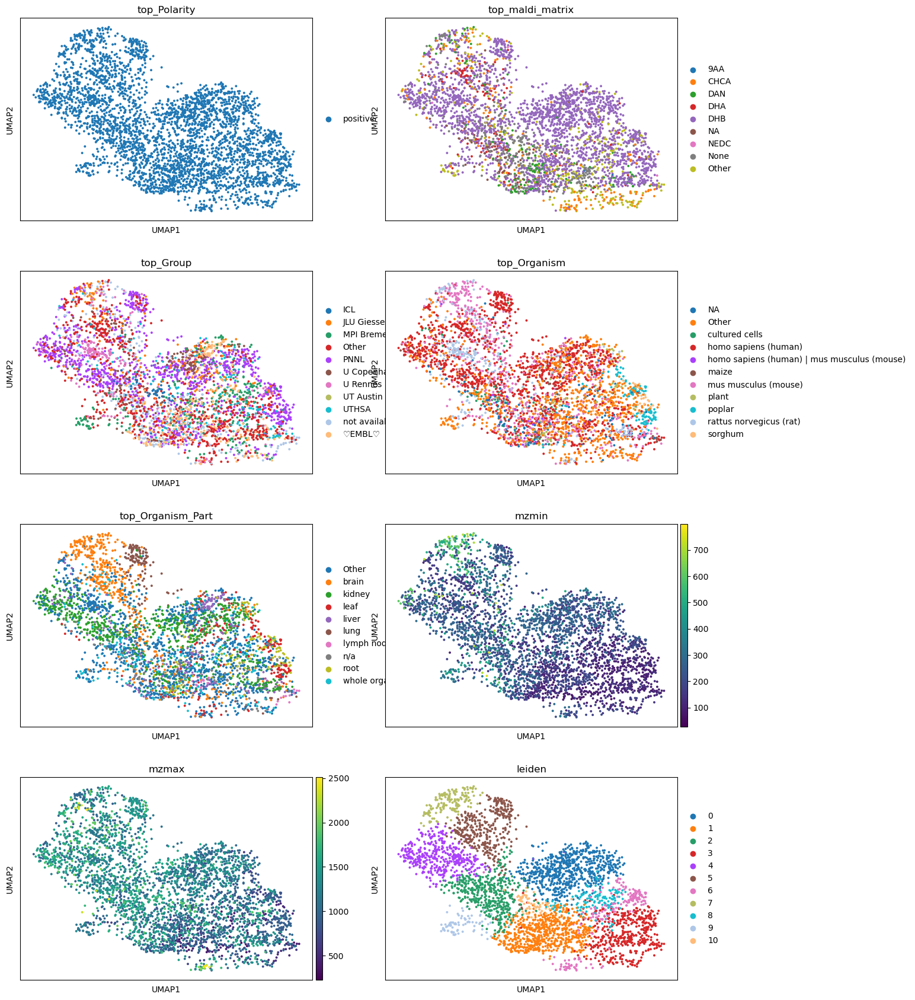

In [25]:
sc.pl.umap(adata_mol_pos_bbknn, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 
                             'top_Organism', 'top_Organism_Part', 'mzmin', 
                             'mzmax', 'leiden'], 
           ncols=2)

### Negative

In [32]:
adata_mol_neg = pickle.load(open( os.path.join(store_dir, 'all_datasets_mol_anndata.pickle'), "rb" ))
adata_mol_neg = adata_mol_neg[adata_mol_neg.obs['Polarity']=='negative',:]
sc.pp.filter_genes(adata_mol_neg, min_cells=200)
sc.pp.filter_cells(adata_mol_neg, min_genes=50)
sc.pp.normalize_total(adata_mol_neg, target_sum=1e4)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [33]:
sc.pp.neighbors(adata_mol_neg, metric='cosine')
sc.tl.leiden(adata_mol_neg)
sc.tl.umap(adata_mol_neg)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

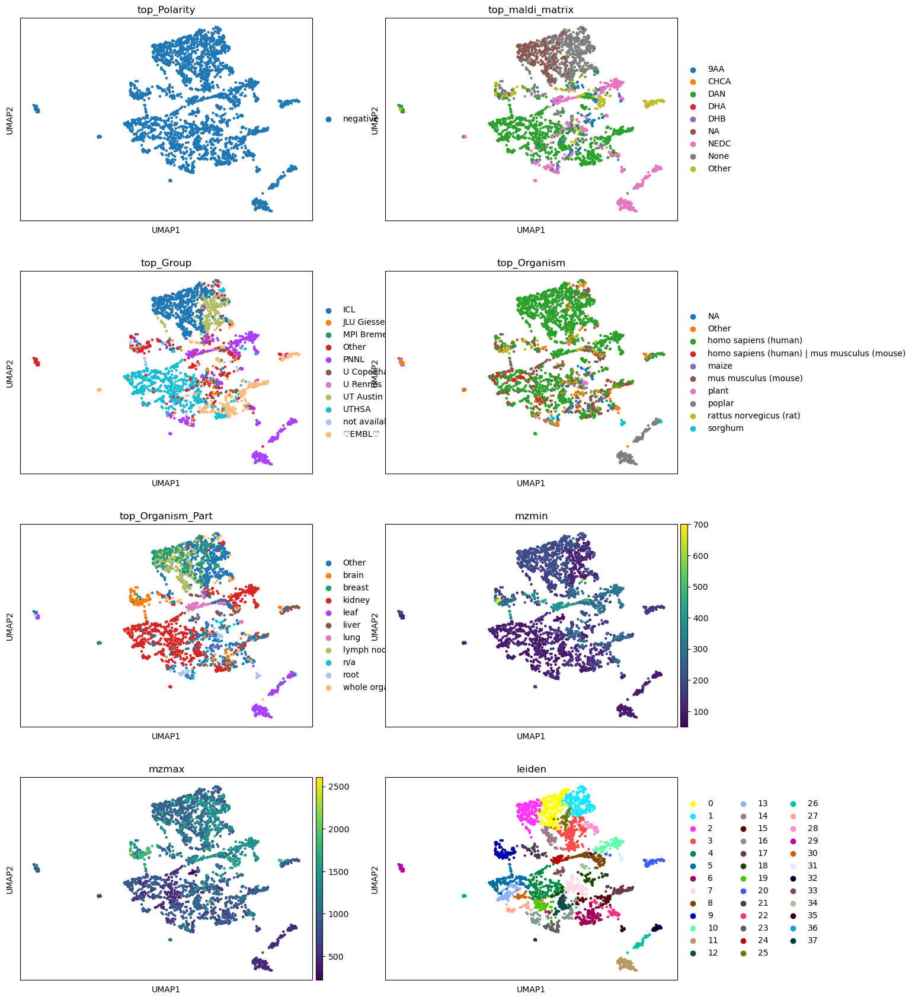

In [34]:
sc.pl.umap(adata_mol_neg, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 
                             'top_Organism', 'top_Organism_Part', 'mzmin', 
                             'mzmax', 'leiden'], 
           ncols=2)

#### BBKNN

In [35]:
adata_mol_neg_bbknn = pickle.load(open( os.path.join(store_dir, 'all_datasets_mol_anndata.pickle'), "rb" ))
adata_mol_neg_bbknn = adata_mol_neg_bbknn[adata_mol_neg_bbknn.obs['Polarity']=='negative',:]
sc.pp.filter_genes(adata_mol_neg_bbknn, min_cells=200)
sc.pp.filter_cells(adata_mol_neg_bbknn, min_genes=50)
sc.pp.normalize_total(adata_mol_neg_bbknn, target_sum=1e4)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [36]:
sc.tl.pca(adata_mol_neg_bbknn)
sc.external.pp.bbknn(adata_mol_neg_bbknn, batch_key='maldi_matrix', metric='euclidean', neighbors_within_batch=1)
sc.tl.leiden(adata_mol_neg_bbknn)
sc.tl.umap(adata_mol_neg_bbknn)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

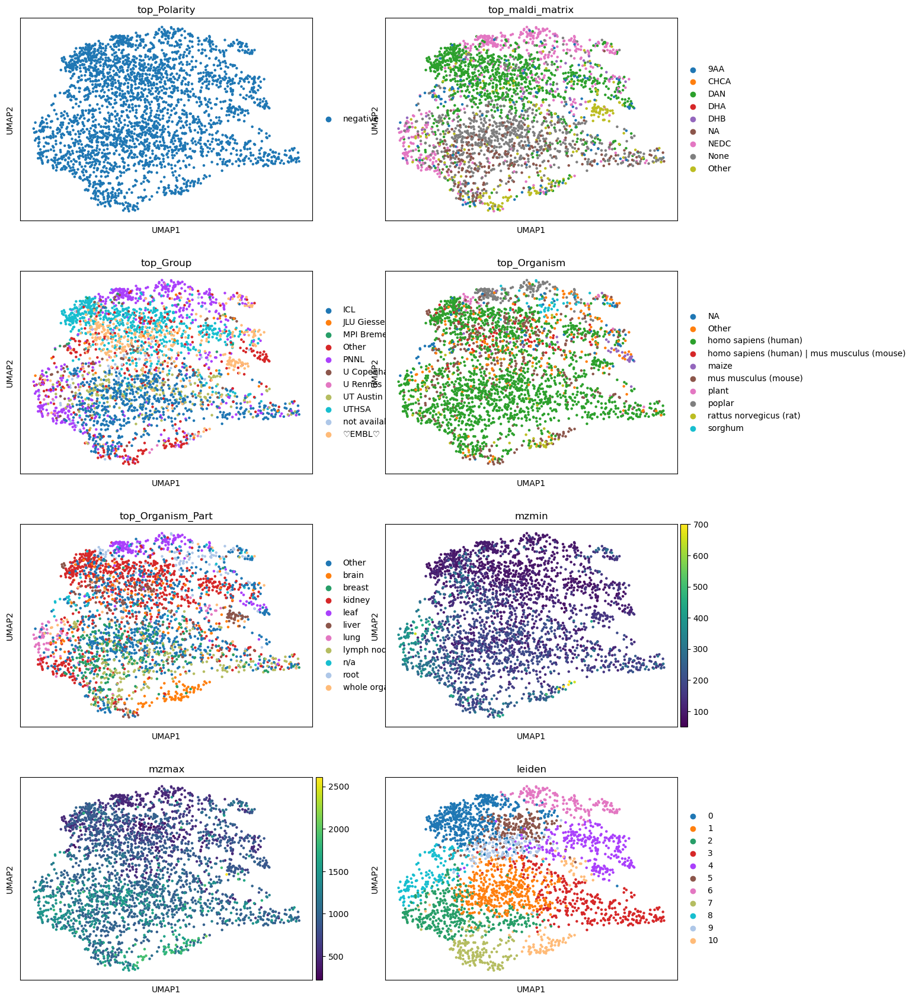

In [37]:
sc.pl.umap(adata_mol_neg_bbknn, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 
                             'top_Organism', 'top_Organism_Part', 'mzmin', 
                             'mzmax', 'leiden'], 
           ncols=2)

## Ions

In [59]:
adata = pickle.load(open( os.path.join(store_dir, 'all_datasets_anndata.pickle'), "rb" ))

In [60]:
sc.pp.filter_genes(adata, min_cells=200)
sc.pp.filter_cells(adata, min_genes=50)
sc.pp.normalize_total(adata, target_sum=1e4)

In [61]:
adata

AnnData object with n_obs × n_vars = 6504 × 9437
    obs: 'Organism', 'Condition', 'Organism_Part', 'Polarity', 'maldi_matrix', 'Group', 'mzmin', 'mzmax', 'top_Organism', 'top_Condition', 'top_Organism_Part', 'top_Polarity', 'top_maldi_matrix', 'top_Group', 'n_genes'
    var: 0, 'n_cells'

In [62]:
sc.pp.neighbors(adata, metric='cosine')

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [63]:
sc.tl.umap(adata)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

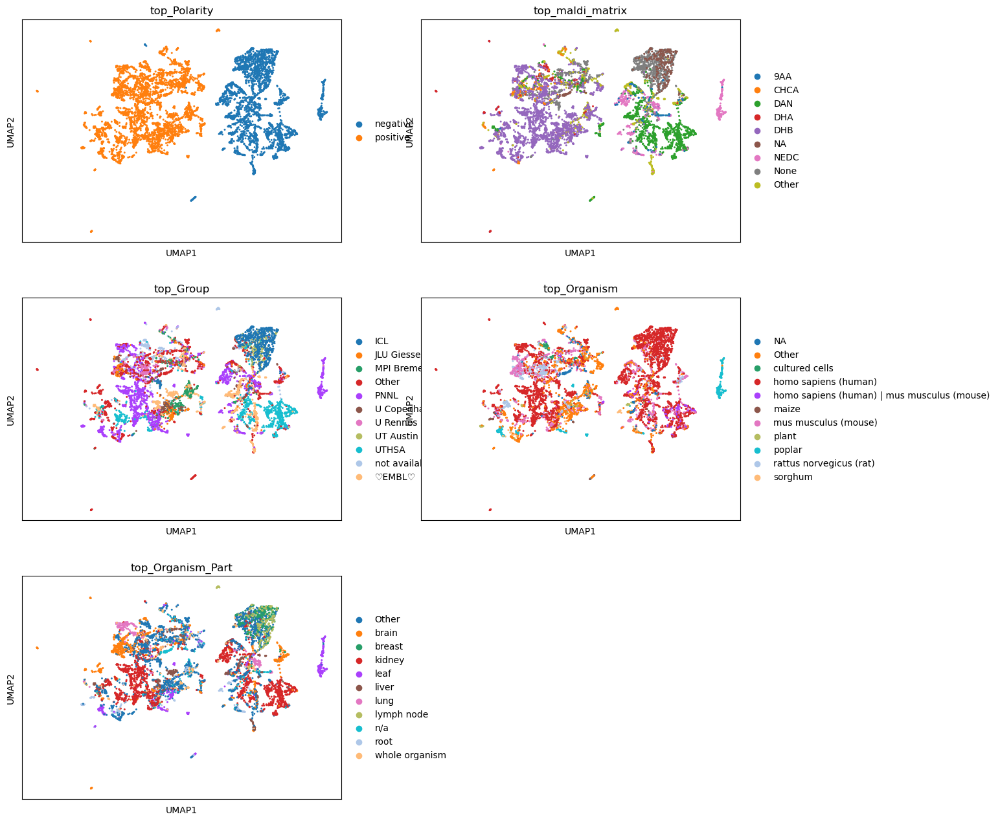

In [64]:
sc.pl.umap(adata, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 'top_Organism', 'top_Organism_Part'], ncols=2)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data f

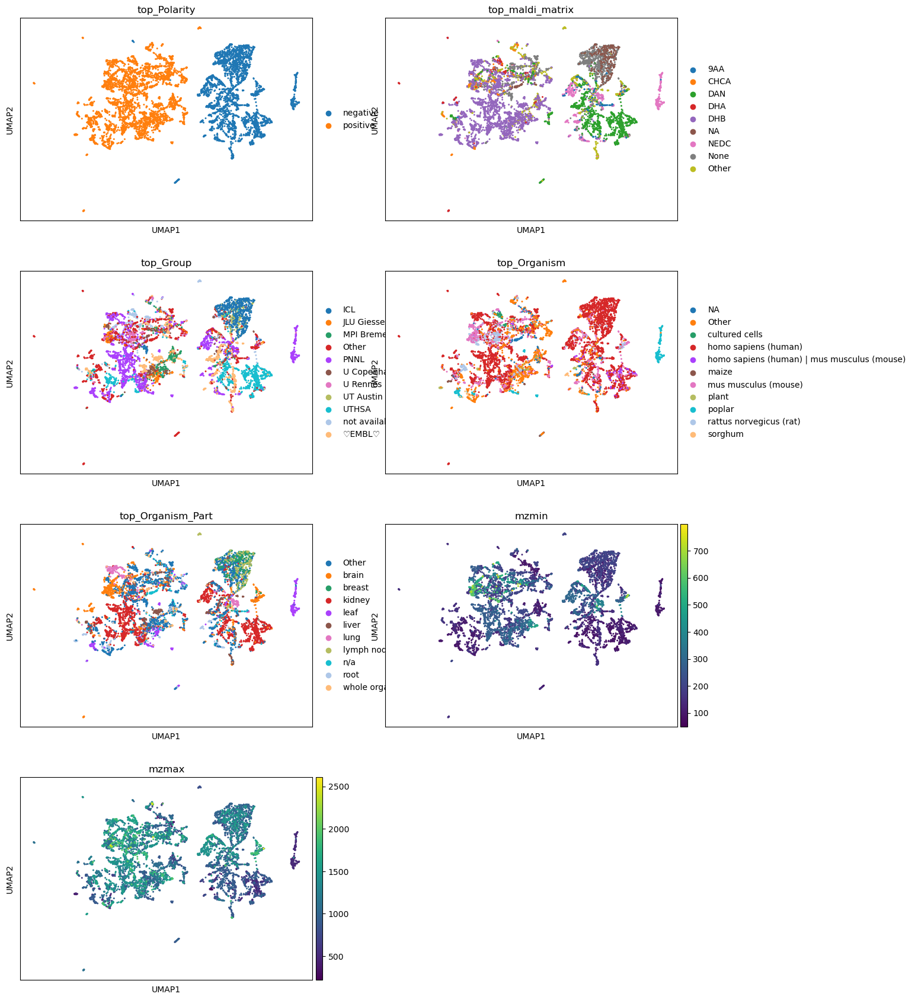

In [65]:
sc.pl.umap(adata, color=['top_Polarity', 'top_maldi_matrix', 'top_Group', 'top_Organism', 'top_Organism_Part', 'mzmin', 'mzmax'], ncols=2)

### Positive

In [34]:
adata_pos = pickle.load(open( os.path.join(store_dir, 'all_datasets_anndata.pickle'), "rb" ))

In [35]:
adata_pos = adata_pos[adata_pos.obs['Polarity']=='positive',:]

In [36]:
sc.pp.filter_genes(adata_pos, min_cells=200)
sc.pp.filter_cells(adata_pos, min_genes=50)
sc.pp.normalize_total(adata_pos, target_sum=1e4)
sc.pp.neighbors(adata_pos, metric='cosine')
sc.tl.umap(adata_pos)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


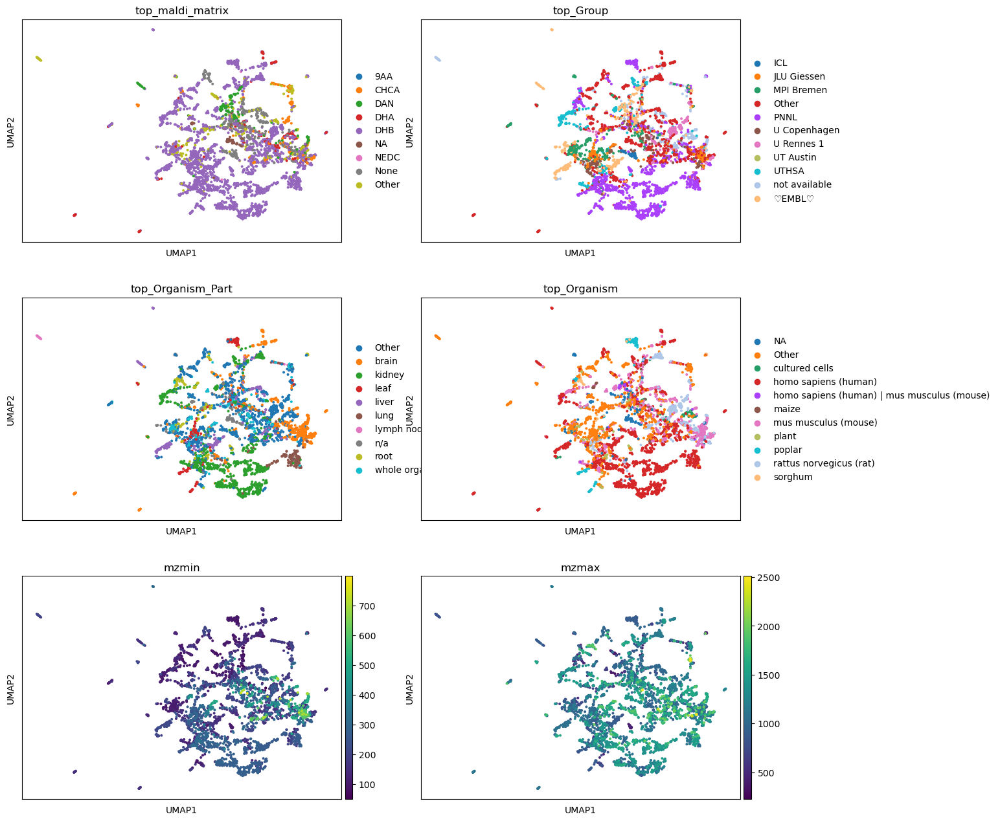

In [66]:
sc.pl.umap(adata_pos, color=['top_maldi_matrix', 'top_Group', 'top_Organism_Part', 'top_Organism', 'mzmin', 'mzmax'], ncols=2)

#### BBKNN

In [67]:
adata_pos_bbknn = pickle.load(open( os.path.join(store_dir, 'all_datasets_anndata.pickle'), "rb" ))
adata_pos_bbknn = adata_pos_bbknn[adata_pos_bbknn.obs['Polarity']=='positive',:]
sc.pp.filter_genes(adata_pos_bbknn, min_cells=200)
sc.pp.filter_cells(adata_pos_bbknn, min_genes=50)
sc.pp.normalize_total(adata_pos_bbknn, target_sum=1e4)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [82]:
sc.tl.pca(adata_pos_bbknn)
sc.external.pp.bbknn(adata_pos_bbknn, batch_key='maldi_matrix', metric='euclidean', neighbors_within_batch=1)
sc.tl.umap(adata_pos_bbknn)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


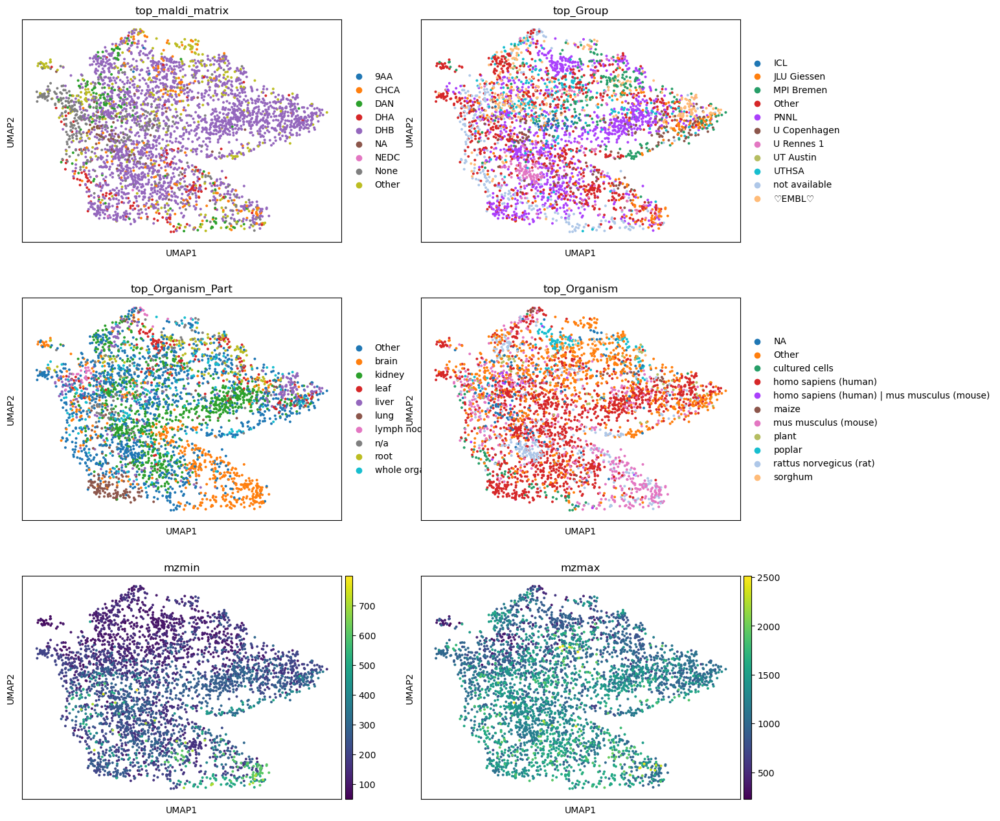

In [83]:
sc.pl.umap(adata_pos_bbknn, color=['top_maldi_matrix', 'top_Group', 'top_Organism_Part', 'top_Organism', 'mzmin', 'mzmax'], ncols=2)

#### Harmony

In [85]:
adata_pos_harmony = pickle.load(open( os.path.join(store_dir, 'all_datasets_anndata.pickle'), "rb" ))
adata_pos_harmony = adata_pos_harmony[adata_pos_harmony.obs['Polarity']=='positive',:]
sc.pp.filter_genes(adata_pos_harmony, min_cells=200)
sc.pp.filter_cells(adata_pos_harmony, min_genes=50)
sc.pp.normalize_total(adata_pos_harmony, target_sum=1e4)

sc.tl.pca(adata_pos_harmony)

sc.external.pp.harmony_integrate(adata_pos_harmony, 'maldi_matrix')

sc.pp.neighbors(adata_pos_harmony, metric='cosine', use_rep='X_pca_harmony')
sc.tl.umap(adata_pos_harmony)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
2023-02-07 15:23:55,106 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-02-07 15:24:10,654 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-02-07 15:24:10,748 - harmonypy - INFO - Iteration 1 of 10
2023-02-07 15:24:25,050 - harmonypy - INFO - Iteration 2 of 10
2023-02-07 15:24:38,047 - harmonypy - INFO - Iteration 3 of 10
2023-02-07 15:24:50,447 - harmonypy - INFO - Iteration 4 of 10
2023-02-07 15:25:00,860 - harmonypy - INFO - Iteration 5 of 10
2023-02-07 15:25:11,657 - harmonypy - INFO - Iteration 6 of 10
2023-02-07 15:25:21,952 - harmonypy - INFO - Iteration 7 of 10
2023-02-07 15:25:32,744 - harmonypy - INFO - Iteration 8 of 10
2023-02-07 15:25:47,278 - harmonypy - INFO - Iteration 9 of 10
2023-02-07 15:26

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


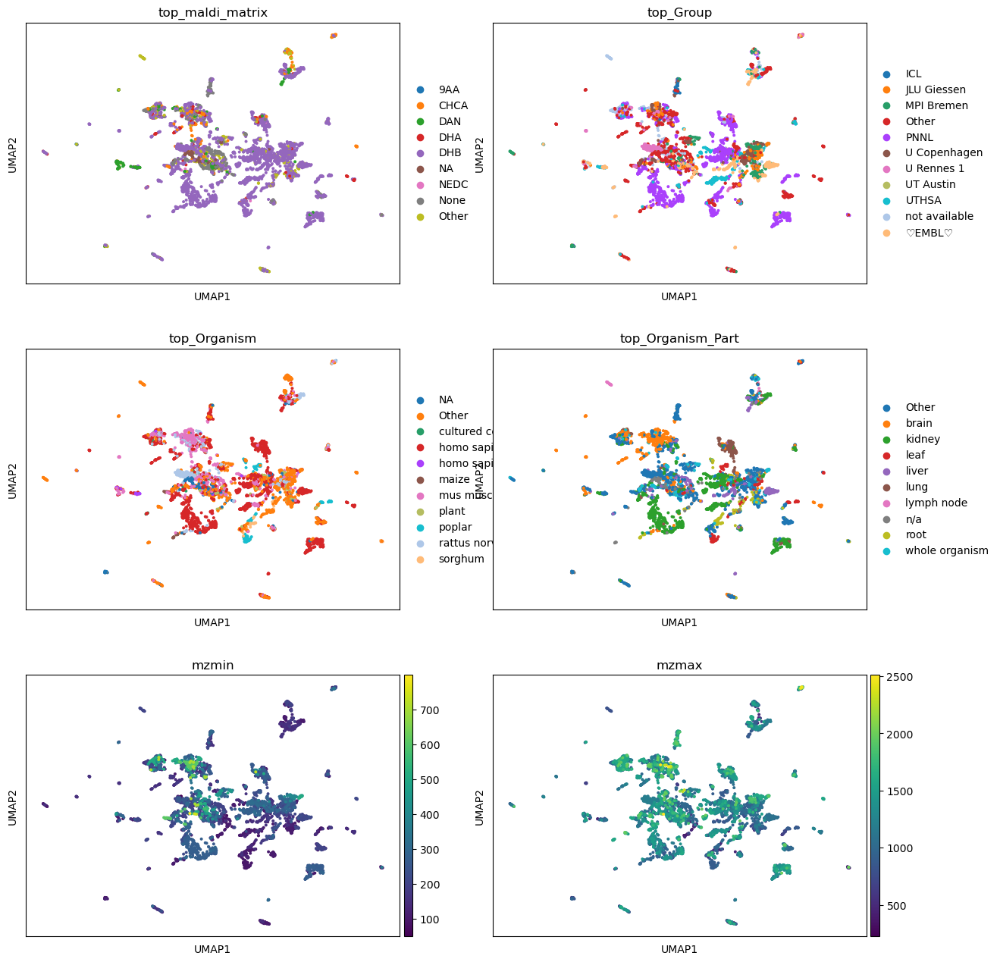

In [86]:
sc.pl.umap(adata_pos_harmony, color=['top_maldi_matrix', 'top_Group', 'top_Organism', 'top_Organism_Part', 'mzmin', 'mzmax'], ncols=2)

### Negative

In [74]:
adata_neg = pickle.load(open( os.path.join(store_dir, 'all_datasets_anndata.pickle'), "rb" ))
adata_neg = adata_neg[adata_neg.obs['Polarity']=='negative',:]

In [75]:
sc.pp.filter_genes(adata_neg, min_cells=200)
sc.pp.filter_cells(adata_neg, min_genes=50)
sc.pp.normalize_total(adata_neg, target_sum=1e4)
sc.pp.neighbors(adata_neg, metric='cosine')
sc.tl.umap(adata_neg)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


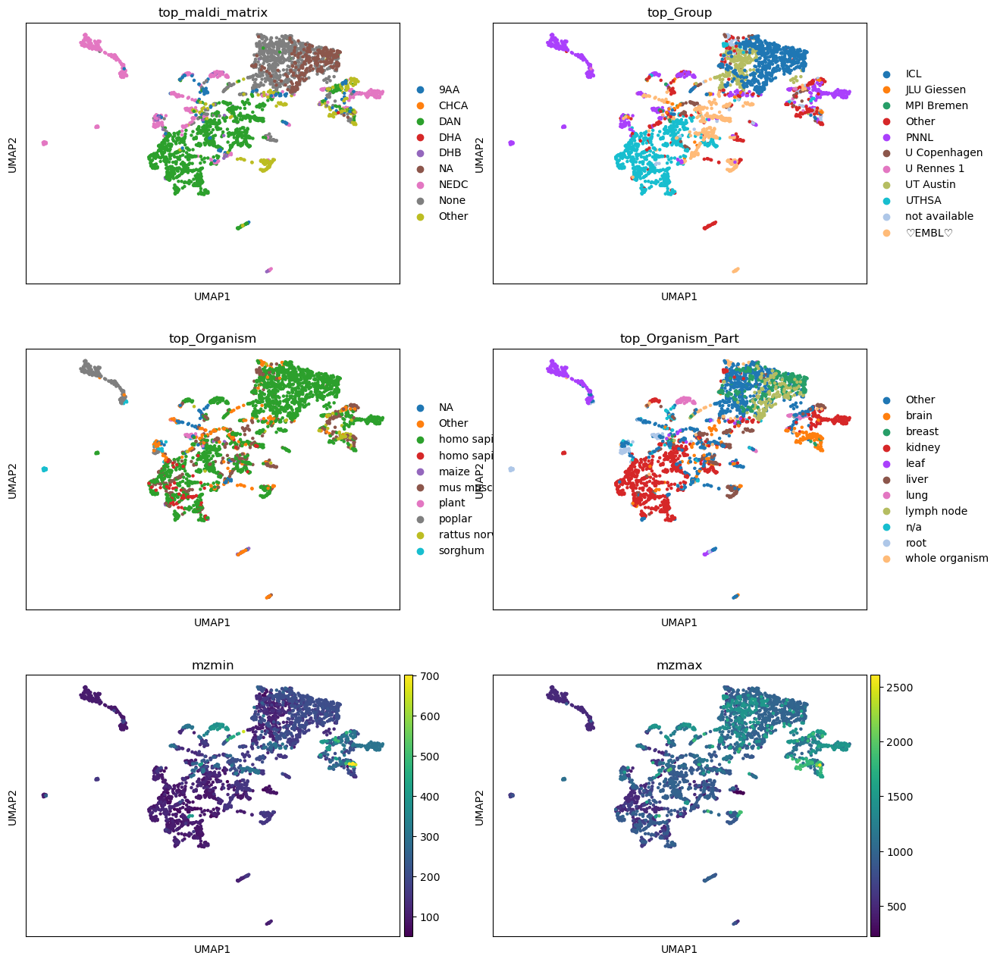

In [77]:
sc.pl.umap(adata_neg, color=['top_maldi_matrix', 'top_Group', 'top_Organism', 'top_Organism_Part', 'mzmin', 'mzmax'], ncols=2)

#### BBKNN

In [78]:
adata_neg_bbknn = pickle.load(open( os.path.join(store_dir, 'all_datasets_anndata.pickle'), "rb" ))
adata_neg_bbknn = adata_neg_bbknn[adata_neg_bbknn.obs['Polarity']=='negative',:]
sc.pp.filter_genes(adata_neg_bbknn, min_cells=200)
sc.pp.filter_cells(adata_neg_bbknn, min_genes=50)
sc.pp.normalize_total(adata_neg_bbknn, target_sum=1e4)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [79]:
sc.tl.pca(adata_neg_bbknn)
sc.external.pp.bbknn(adata_neg_bbknn, batch_key='maldi_matrix', metric='euclidean', neighbors_within_batch=1)
sc.tl.umap(adata_neg_bbknn)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


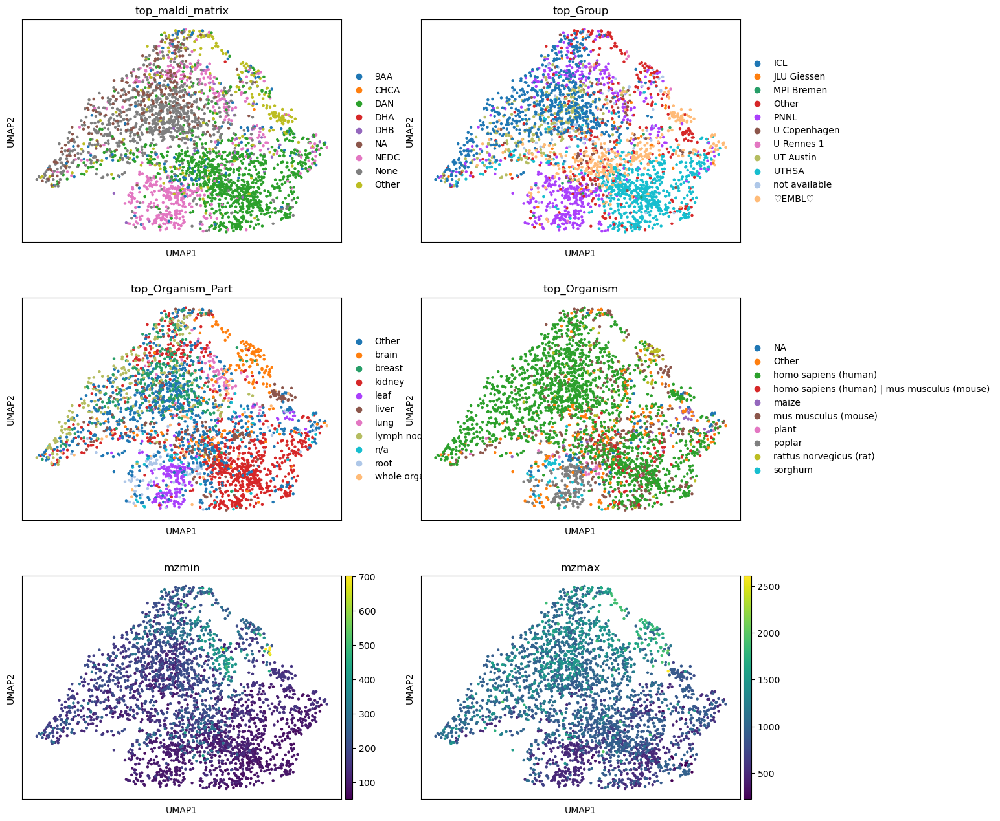

In [80]:
sc.pl.umap(adata_neg_bbknn, color=['top_maldi_matrix', 'top_Group', 'top_Organism_Part', 'top_Organism', 'mzmin', 'mzmax'], ncols=2)

#### Harmony

In [87]:
adata_neg_harmony = pickle.load(open( os.path.join(store_dir, 'all_datasets_anndata.pickle'), "rb" ))
adata_neg_harmony = adata_neg_harmony[adata_neg_harmony.obs['Polarity']=='negative',:]
sc.pp.filter_genes(adata_neg_harmony, min_cells=200)
sc.pp.filter_cells(adata_neg_harmony, min_genes=50)
sc.pp.normalize_total(adata_neg_harmony, target_sum=1e4)

sc.tl.pca(adata_neg_harmony)

sc.external.pp.harmony_integrate(adata_neg_harmony, 'maldi_matrix')

sc.pp.neighbors(adata_neg_harmony, metric='cosine', use_rep='X_pca_harmony')
sc.tl.umap(adata_neg_harmony)

/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
2023-02-07 15:43:57,965 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-02-07 15:44:10,864 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-02-07 15:44:10,960 - harmonypy - INFO - Iteration 1 of 10
2023-02-07 15:44:21,455 - harmonypy - INFO - Iteration 2 of 10
2023-02-07 15:44:31,451 - harmonypy - INFO - Iteration 3 of 10
2023-02-07 15:44:45,946 - harmonypy - INFO - Iteration 4 of 10
2023-02-07 15:45:00,153 - harmonypy - INFO - Iteration 5 of 10
2023-02-07 15:45:10,353 - harmonypy - INFO - Iteration 6 of 10
2023-02-07 15:45:20,754 - harmonypy - INFO - Iteration 7 of 10
2023-02-07 15:45:28,049 - harmonypy - INFO - Converged after 7 iterations


/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/trose/.conda/envs/metabolomics/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


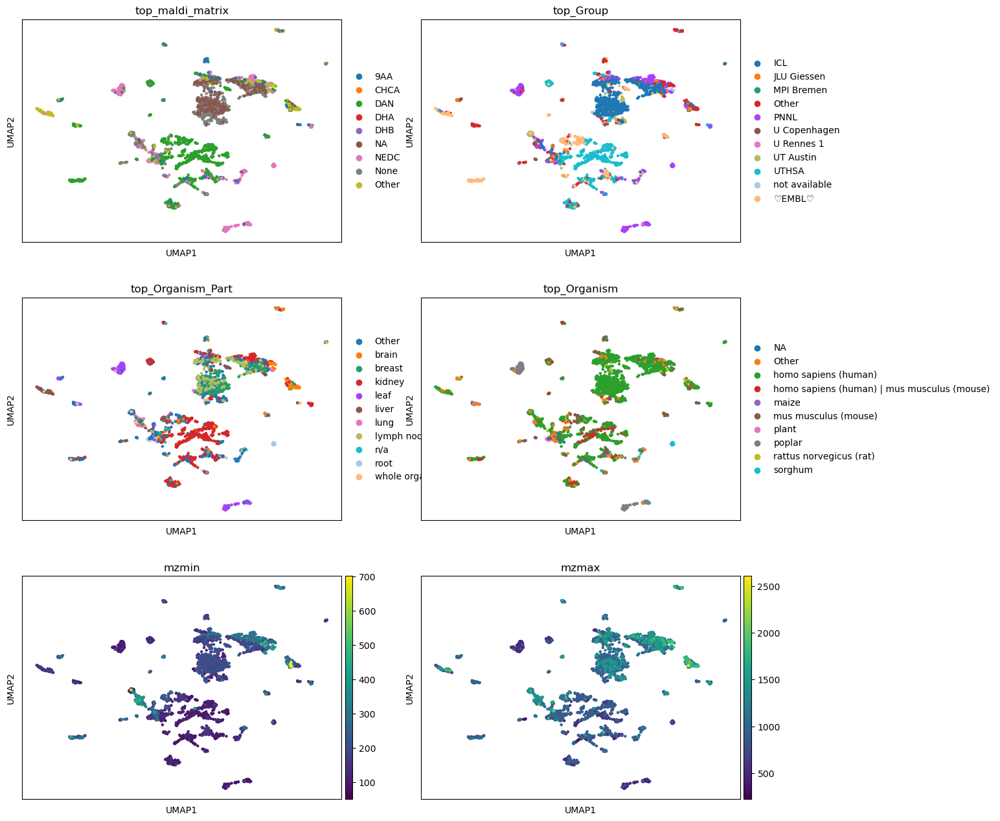

In [88]:
sc.pl.umap(adata_neg_harmony, color=['top_maldi_matrix', 'top_Group', 'top_Organism_Part', 'top_Organism', 'mzmin', 'mzmax'], ncols=2)